<a href="https://colab.research.google.com/github/Gabriel-Rosa-Arcangelo/RIB0212-2023-1/blob/main/Retina.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive

drive.mount('/content/gdrive/', force_remount=True)

Mounted at /content/gdrive/


In [2]:
%cd /content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR

/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR


In [3]:
ls

keras-retinanet/  SPAIR/  STIR/


In [4]:
!pip install tensorflow

In [5]:
!pip install keras-retinanet

In [6]:
!pip install opencv-python

In [7]:
!pip install --upgrade git+https://github.com/broadinstitute/keras-resnet

  Cloning https://github.com/broadinstitute/keras-resnet to /tmp/pip-req-build-b7qoutzz
  Running command git clone --filter=blob:none --quiet https://github.com/broadinstitute/keras-resnet /tmp/pip-req-build-b7qoutzz
  Resolved https://github.com/broadinstitute/keras-resnet to commit 898a1ee417e940ff12bf73ad44c2aae88501771f
  Preparing metadata (setup.py) ... done


In [8]:
# CLONANDO REPOSITÓRIO DO GIT
!git clone https://github.com/fizyr/keras-retinanet.git
%cd keras-retinanet/
!python setup.py build_ext --inplace

fatal: destination path 'keras-retinanet' already exists and is not an empty directory.
/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR/keras-retinanet
/usr/local/lib/python3.10/dist-packages/setuptools/__init__.py:84: _DeprecatedInstaller: setuptools.installer and fetch_build_eggs are deprecated.
!!

        ********************************************************************************
        Requirements should be satisfied by a PEP 517 installer.
        If you are using pip, you can try `pip install --use-pep517`.
        ********************************************************************************

!!
  dist.fetch_build_eggs(dist.setup_requires)
running build_ext
skipping 'keras_retinanet/utils/compute_overlap.c' Cython extension (up-to-date)


In [9]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import io
import random as rng
import warnings
warnings.filterwarnings("ignore")
import urllib.request
import time
import tensorflow as tf
import keras
from keras_retinanet import models
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color
from keras_retinanet import models
import keras_resnet

In [31]:
def df_plot_orinal(drawOG,img_path,df):
    df=df[df['image_path']==img_path]
    for i,r in df.iterrows():
        cv2.rectangle(drawOG, (r['x'], r['y']), (r['width'], r['height']), (255,0,0),2)


def img_inference(img_path):
    image = read_image_bgr(img_path)

    # copy to draw on
    draw = image.copy()
    draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)
    drawOG = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # preprocess image for network
    image = preprocess_image(image)
    image, scale = resize_image(image)

    # process image
    start = time.time()
    boxes, scores, labels = model.predict_on_batch(np.expand_dims(image, axis=0))
    df_plot_orinal(drawOG,img_path,dados_test)
    # correct for image scale
    boxes /= scale
    # visualize detections
    for box, score, label in zip(boxes[0], scores[0], labels[0]):
        # scores are sorted so we can break
        #print(score)
        if score < THRES_SCORE:
          continue
        color = label_color(label)
        b = box.astype(int)
        draw_box(draw, b, color=color)
        caption = "{} {:.3f}%".format(rotulos[label], score*100)

    fig = plt.figure(figsize=(20, 20))
    ax1 = fig.add_subplot(1, 2, 1)
    plt.imshow(draw)
    ax2 = fig.add_subplot(1, 2, 2)
    plt.imshow(drawOG)

    ax1.title.set_text('Predicted')
    ax2.title.set_text('Actual')
    plt.show()

In [27]:
class Imagem(object):
    def __init__(self, tipo, paciente, exame, classe, n_imagem, imagem):
        self.tipo      = tipo      #STIR/SPAIR
        self.paciente  = paciente  #registro do paciente
        self.exame     = exame     #exame1/exame2
        self.classe    = classe    #positivo/negativo
        self.n_imagem  = n_imagem  #nome das imagens dentro da estrutura
        self.imagem    = imagem    #conjunto de imagens

    def PrintStructure(self):
        print(f'Tipo: {self.tipo} \nPaciente: {self.paciente} \nExame: {self.exame} \nClassificação: {self.classe} \nNome da Imagem: {self.n_imagem}')
        plt.imshow(self.imagem, cmap='gray')
        plt.show()

In [11]:
base = '/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR'
pastas = []
imgs = []

for r, d, f in os.walk(base):
  for f1 in f:
    if f1.endswith('tif'):
        mask_temp = os.path.join(r, f1)
        pastas.append(mask_temp)
        if f1.startswith('_'):
          imgs.append(os.path.join(r, f1))

In [12]:
print(pastas)

['/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR/STIR/Anonimizados/Negativo/Patient_9/47812_Articulacao_Sacro_IliacaInvestigacao_Monoartrite - 19582030/mask.nrrd/3.tif', '/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR/STIR/Anonimizados/Negativo/Patient_9/47812_Articulacao_Sacro_IliacaInvestigacao_Monoartrite - 19582030/mask.nrrd/1.tif', '/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR/STIR/Anonimizados/Negativo/Patient_9/47812_Articulacao_Sacro_IliacaInvestigacao_Monoartrite - 19582030/mask.nrrd/2.tif', '/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR/STIR/Anonimizados/Negativo/Patient_9/47812_Articulacao_Sacro_IliacaInvestigacao_Monoartrite - 19582030/mask.nrrd/4.tif', '/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR/STIR/Anonimizados/Negativo/Patient_9/47812_Articulacao_Sacro_IliacaInvestigacao_Monoartrite - 19582030/mask.nrrd/5.tif', '/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR/STIR/Anonimizados/Negativo/Patient_9/47812_Articulacao_Sacro_IliacaInvestiga

In [13]:
df_pastas = pd.Series(pastas).str.split('/', expand=True).drop(columns=[0,1,2,3,4,6])
df_pastas.columns = range(df_pastas.shape[1])
print(df_pastas.to_string())

          0         1           2                                                                        3                  4                  5
0      STIR  Negativo   Patient_9        47812_Articulacao_Sacro_IliacaInvestigacao_Monoartrite - 19582030          mask.nrrd              3.tif
1      STIR  Negativo   Patient_9        47812_Articulacao_Sacro_IliacaInvestigacao_Monoartrite - 19582030          mask.nrrd              1.tif
2      STIR  Negativo   Patient_9        47812_Articulacao_Sacro_IliacaInvestigacao_Monoartrite - 19582030          mask.nrrd              2.tif
3      STIR  Negativo   Patient_9        47812_Articulacao_Sacro_IliacaInvestigacao_Monoartrite - 19582030          mask.nrrd              4.tif
4      STIR  Negativo   Patient_9        47812_Articulacao_Sacro_IliacaInvestigacao_Monoartrite - 19582030          mask.nrrd              5.tif
5      STIR  Negativo   Patient_9        47812_Articulacao_Sacro_IliacaInvestigacao_Monoartrite - 19582030          mask.nrrd     

In [14]:
df_pastas = df_pastas[df_pastas[3].str.contains('mask.nrrd') | df_pastas[4].str.contains('mask.nrrd')]
df_pastas_ex1 = df_pastas[~df_pastas[3].str.contains('Exame 2')].assign(Exame='Exame 1')
df_pastas_ex2 = df_pastas[df_pastas[3].str.contains('Exame 2')].assign(Exame='Exame 2')
df_pastas = pd.concat([df_pastas_ex1,df_pastas_ex2])
df_pastas[4] = df_pastas[4].fillna('').where(df_pastas[4].str.endswith('.tif'), df_pastas[5].fillna(''))
df_pastas = df_pastas.drop(columns=[3,5])
df_pastas.columns = ['tipo', 'classe', 'paciente', 'nome_imagem', 'exame']
df_pastas = df_pastas.sort_values(['paciente','tipo','exame','nome_imagem'], ascending=[True, True, True, True]).reset_index(drop='True')
print(df_pastas.to_string())

      tipo    classe    paciente nome_imagem    exame
0    SPAIR  Negativo   Patient_1       1.tif  Exame 1
1    SPAIR  Negativo   Patient_1       2.tif  Exame 1
2    SPAIR  Negativo   Patient_1       3.tif  Exame 1
3    SPAIR  Negativo   Patient_1       4.tif  Exame 1
4    SPAIR  Negativo   Patient_1       5.tif  Exame 1
5    SPAIR  Negativo   Patient_1       6.tif  Exame 1
6     STIR  Negativo   Patient_1       1.tif  Exame 1
7     STIR  Negativo   Patient_1       2.tif  Exame 1
8     STIR  Negativo   Patient_1       3.tif  Exame 1
9     STIR  Negativo   Patient_1       4.tif  Exame 1
10    STIR  Negativo   Patient_1       5.tif  Exame 1
11    STIR  Negativo   Patient_1       6.tif  Exame 1
12   SPAIR  Positivo  Patient_10       1.tif  Exame 1
13   SPAIR  Positivo  Patient_10       2.tif  Exame 1
14   SPAIR  Positivo  Patient_10       3.tif  Exame 1
15   SPAIR  Positivo  Patient_10       4.tif  Exame 1
16   SPAIR  Positivo  Patient_10       5.tif  Exame 1
17   SPAIR  Positivo  Patien

In [15]:
df_imgs = pd.Series(imgs).str.split('/', expand=True).drop(columns=[0,1,2,3,4,6])
df_imgs.columns = range(df_imgs.shape[1])
df_imgs_ex1 = df_imgs[~df_imgs[3].str.contains('Exame 2')].assign(Exame='Exame 1')
df_imgs_ex2 = df_imgs[df_imgs[3].str.contains('Exame 2')].assign(Exame='Exame 2')
df_imgs = pd.concat([df_imgs_ex1,df_imgs_ex2]).sort_index()
df_imgs[4] = df_imgs[4].fillna('').where(df_imgs[4].str.endswith('.tif'), df_imgs[5].fillna(''))
df_imgs = df_imgs.drop(columns=[3,5])
df_imgs.columns = ['tipo', 'classe', 'paciente', 'nome_imagem', 'exame']
df_imgs = df_imgs.sort_values(['paciente','tipo','exame','nome_imagem'], ascending=[True, True, True, True]).reset_index(drop='True')
print(df_imgs.to_string())

      tipo    classe    paciente        nome_imagem    exame
0    SPAIR  Negativo   Patient_1  _IM-0001-0005.tif  Exame 1
1    SPAIR  Negativo   Patient_1  _IM-0001-0006.tif  Exame 1
2    SPAIR  Negativo   Patient_1  _IM-0001-0007.tif  Exame 1
3    SPAIR  Negativo   Patient_1  _IM-0001-0008.tif  Exame 1
4    SPAIR  Negativo   Patient_1  _IM-0001-0009.tif  Exame 1
5    SPAIR  Negativo   Patient_1  _IM-0001-0010.tif  Exame 1
6     STIR  Negativo   Patient_1  _IM-0025-0005.tif  Exame 1
7     STIR  Negativo   Patient_1  _IM-0025-0006.tif  Exame 1
8     STIR  Negativo   Patient_1  _IM-0025-0007.tif  Exame 1
9     STIR  Negativo   Patient_1  _IM-0025-0008.tif  Exame 1
10    STIR  Negativo   Patient_1  _IM-0025-0009.tif  Exame 1
11    STIR  Negativo   Patient_1  _IM-0025-0010.tif  Exame 1
12   SPAIR  Positivo  Patient_10  _IM-0003-0007.tif  Exame 1
13   SPAIR  Positivo  Patient_10  _IM-0003-0008.tif  Exame 1
14   SPAIR  Positivo  Patient_10  _IM-0003-0009.tif  Exame 1
15   SPAIR  Positivo  Pa

In [16]:
imgs = []
pastas_imgs = pastas.copy()

for index, row in df_imgs.iterrows():
    tipo = row['tipo']
    paciente = row['paciente']
    exame = row['exame']
    classe = row['classe']
    n_imagem = row['nome_imagem']
    if exame == 'Exame 2':
      for item in pastas_imgs:
        if tipo in item and paciente + "/" in item and "Exame 2" in item and classe in item and n_imagem in item:
          print(item)
          imgs.append(Imagem(tipo,paciente,exame,classe,n_imagem,cv2.imread(item, -1)))
          pastas_imgs.remove(item)
          break
    else:
      for item in pastas_imgs:
        if tipo in item and paciente + "/" in item and "Exame 2" not in item and classe in item and n_imagem in item:
          print(item)
          imgs.append(Imagem(tipo,paciente,exame,classe,n_imagem,cv2.imread(item, -1)))
          pastas_imgs.remove(item)
          break

/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR/SPAIR/Anonimizados/Negativo/Patient_1/COR_T2_SPAIR_301/_IM-0001-0005.tif
/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR/SPAIR/Anonimizados/Negativo/Patient_1/COR_T2_SPAIR_301/_IM-0001-0006.tif
/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR/SPAIR/Anonimizados/Negativo/Patient_1/COR_T2_SPAIR_301/_IM-0001-0007.tif
/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR/SPAIR/Anonimizados/Negativo/Patient_1/COR_T2_SPAIR_301/_IM-0001-0008.tif
/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR/SPAIR/Anonimizados/Negativo/Patient_1/COR_T2_SPAIR_301/_IM-0001-0009.tif
/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR/SPAIR/Anonimizados/Negativo/Patient_1/COR_T2_SPAIR_301/_IM-0001-0010.tif
/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR/STIR/Anonimizados/Negativo/Patient_1/41799__Sacro_Iliacas__Espondilite_Anquilosante - 430001888/STIR_TSE_COR_601/_IM-0025-0005.tif
/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR/STIR/Anonimizad

In [17]:
masks = []
pastas_masks = pastas.copy()

for index, row in df_pastas.iterrows():
    tipo = row['tipo']
    paciente = row['paciente']
    exame = row['exame']
    classe = row['classe']
    n_imagem = row['nome_imagem']
    if exame == 'Exame 2':
      for item in pastas_masks:
        if "mask.nrrd" in item and tipo in item and paciente + "/" in item and "Exame 2" in item and classe in item and n_imagem in item:
          #print(tipo + " - " + paciente + " - " + exame + " - " + classe + " - " + n_imagem)
          print(item)
          masks.append(Imagem(tipo,paciente,exame,classe,n_imagem,cv2.imread(item, -1)))
          pastas_masks.remove(item)
          break
    else:
      for item in pastas_masks:
        if "mask.nrrd" in item and tipo in item and paciente + "/" in item and "Exame 2" not in item and classe in item and n_imagem in item:
          #print(tipo + " - " + paciente + " - " + exame + " - " + classe + " - " + n_imagem)
          print(item)
          masks.append(Imagem(tipo,paciente,exame,classe,n_imagem,cv2.imread(item, -1)))
          pastas_masks.remove(item)
          break

/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR/STIR/Anonimizados/Negativo/Patient_1/41799__Sacro_Iliacas__Espondilite_Anquilosante - 430001888/mask.nrrd/1.tif
/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR/STIR/Anonimizados/Negativo/Patient_1/41799__Sacro_Iliacas__Espondilite_Anquilosante - 430001888/mask.nrrd/2.tif
/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR/STIR/Anonimizados/Negativo/Patient_1/41799__Sacro_Iliacas__Espondilite_Anquilosante - 430001888/mask.nrrd/3.tif
/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR/STIR/Anonimizados/Negativo/Patient_1/41799__Sacro_Iliacas__Espondilite_Anquilosante - 430001888/mask.nrrd/4.tif
/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR/STIR/Anonimizados/Negativo/Patient_1/41799__Sacro_Iliacas__Espondilite_Anquilosante - 430001888/mask.nrrd/5.tif
/content/gdrive/MyDrive/RM Sacroilíacas STIR&SPAIR/STIR/Anonimizados/Negativo/Patient_1/41799__Sacro_Iliacas__Espondilite_Anquilosante - 430001888/mask.nrrd/6.tif
/content/gdrive/

In [18]:
for imagem in imgs:
  imagem.PrintStructure()

Tipo: SPAIR 
Paciente: Patient_1 
Exame: Exame 1 
Classificação: Negativo 
Nome da Imagem: _IM-0001-0005.tif
Tipo: SPAIR 
Paciente: Patient_1 
Exame: Exame 1 
Classificação: Negativo 
Nome da Imagem: _IM-0001-0006.tif
Tipo: SPAIR 
Paciente: Patient_1 
Exame: Exame 1 
Classificação: Negativo 
Nome da Imagem: _IM-0001-0007.tif
Tipo: SPAIR 
Paciente: Patient_1 
Exame: Exame 1 
Classificação: Negativo 
Nome da Imagem: _IM-0001-0008.tif
Tipo: SPAIR 
Paciente: Patient_1 
Exame: Exame 1 
Classificação: Negativo 
Nome da Imagem: _IM-0001-0009.tif
Tipo: SPAIR 
Paciente: Patient_1 
Exame: Exame 1 
Classificação: Negativo 
Nome da Imagem: _IM-0001-0010.tif
Tipo: STIR 
Paciente: Patient_1 
Exame: Exame 1 
Classificação: Negativo 
Nome da Imagem: _IM-0025-0005.tif
Tipo: STIR 
Paciente: Patient_1 
Exame: Exame 1 
Classificação: Negativo 
Nome da Imagem: _IM-0025-0006.tif
Tipo: STIR 
Paciente: Patient_1 
Exame: Exame 1 
Classificação: Negativo 
Nome da Imagem: _IM-0025-0007.tif
Tipo: STIR 
Paciente: 

In [29]:
for mascara in masks:
  mascara.PrintStructure()

Tipo: SPAIR 
Paciente: Patient_1 
Exame: Exame 1 
Classificação: Negativo 
Nome da Imagem: 1.tif
Tipo: SPAIR 
Paciente: Patient_1 
Exame: Exame 1 
Classificação: Negativo 
Nome da Imagem: 2.tif
Tipo: SPAIR 
Paciente: Patient_1 
Exame: Exame 1 
Classificação: Negativo 
Nome da Imagem: 3.tif
Tipo: SPAIR 
Paciente: Patient_1 
Exame: Exame 1 
Classificação: Negativo 
Nome da Imagem: 4.tif
Tipo: SPAIR 
Paciente: Patient_1 
Exame: Exame 1 
Classificação: Negativo 
Nome da Imagem: 5.tif
Tipo: SPAIR 
Paciente: Patient_1 
Exame: Exame 1 
Classificação: Negativo 
Nome da Imagem: 6.tif
Tipo: STIR 
Paciente: Patient_1 
Exame: Exame 1 
Classificação: Negativo 
Nome da Imagem: 1.tif
Tipo: STIR 
Paciente: Patient_1 
Exame: Exame 1 
Classificação: Negativo 
Nome da Imagem: 2.tif
Tipo: STIR 
Paciente: Patient_1 
Exame: Exame 1 
Classificação: Negativo 
Nome da Imagem: 3.tif
Tipo: STIR 
Paciente: Patient_1 
Exame: Exame 1 
Classificação: Negativo 
Nome da Imagem: 4.tif
Tipo: STIR 
Paciente: Patient_1 
E

In [20]:
for i in range(0,len(imgs)):

    if imgs[i].tipo == 'SPAIR':
        path = os.path.join(os.getcwd(),'SPAIR_JPG',imgs[i].paciente, imgs[i].exame, imgs[i].classe)

        im = Image.open(pastas_imgs[i])
        im.thumbnail(im.size)
        nome_arq_img = path + '/' + imgs[i].n_imagem
        nome_arq_img = nome_arq_img[:len(nome_arq_img) - 3] + 'jpeg'

        try:
            os.makedirs(path)
        except:
            pass
        im.save(nome_arq_img, 'JPEG', quality=100)

    elif imgs[i].tipo == 'STIR':
        path = os.path.join(os.getcwd(),'STIR_JPG',imgs[i].paciente, imgs[i].exame, imgs[i].classe)

        im = Image.open(pastas_imgs[i])
        im.thumbnail(im.size)
        nome_arq_img = path + '/' + imgs[i].n_imagem
        nome_arq_img = nome_arq_img[:len(nome_arq_img) - 3] + 'jpeg'

        try:
            os.makedirs(path)
        except:
            pass
        im.save(nome_arq_img, 'JPEG', quality=100)

In [ ]:
pastas_jpg = []
for root, dirs, files in os.walk('.', topdown=False):
  if '_JPG' in root:
    for name in files:
      pastas_jpg.append(os.path.join(root, name))

In [24]:
dados = []

for i in range(0,len(masks)):
    if (masks[i].tipo, masks[i].paciente, masks[i].exame, masks[i].classe) == (imgs[i].tipo, imgs[i].paciente, imgs[i].exame, imgs[i].classe):
        mult = masks[i].imagem * imgs[i].imagem
        dados.append(Imagem(masks[i].tipo,
                            masks[i].paciente,
                            masks[i].exame,
                            masks[i].classe,
                            int(masks[i].n_imagem[0]),
                            mult
                            ))

In [28]:
dados[0].PrintStructure()

Tipo: SPAIR 
Paciente: Patient_1 
Exame: Exame 1 
Classificação: Negativo 
Nome da Imagem: 1


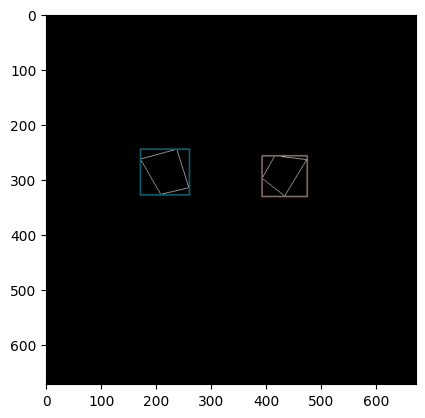

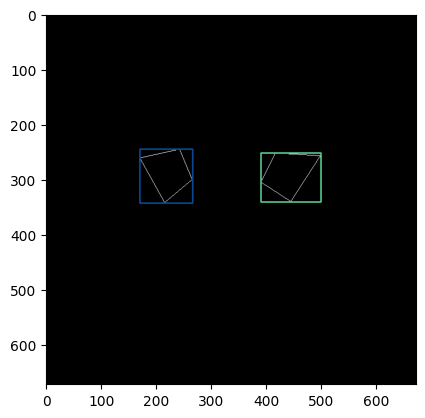

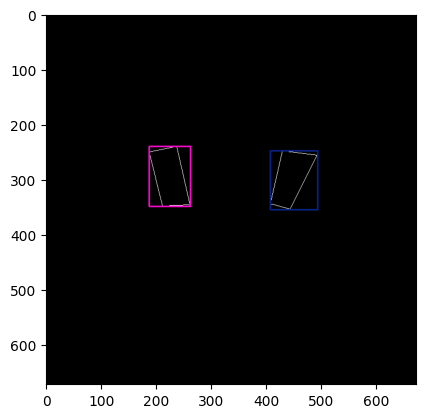

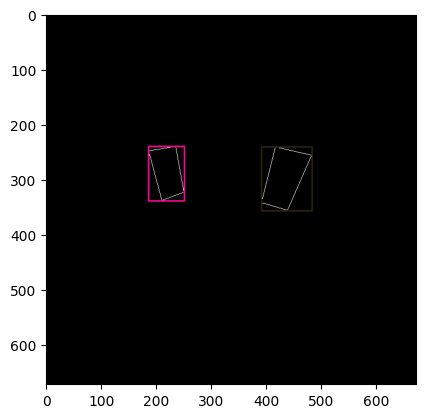

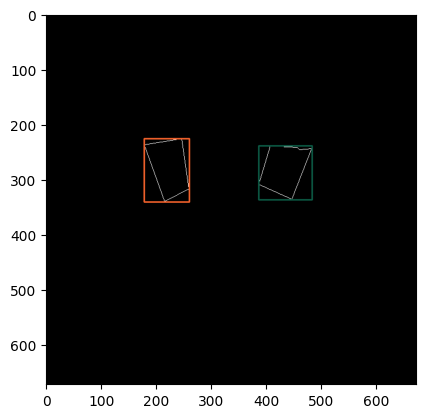

...

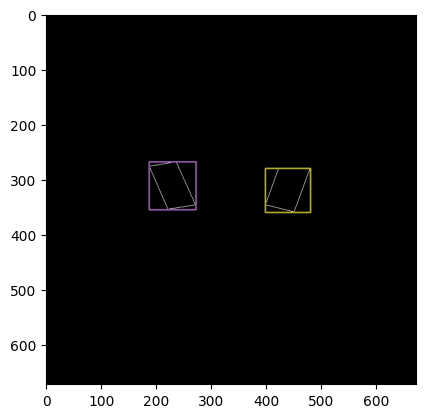

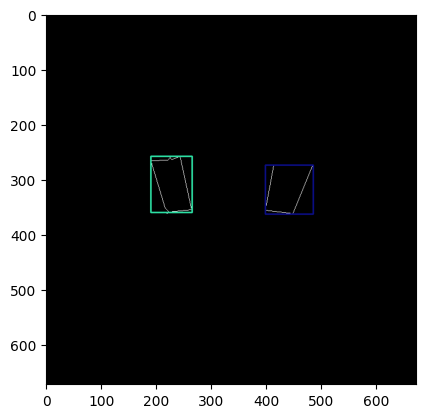

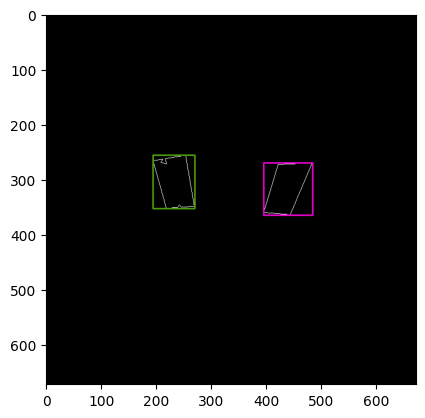

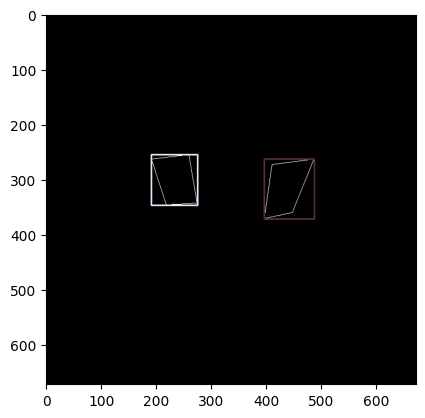

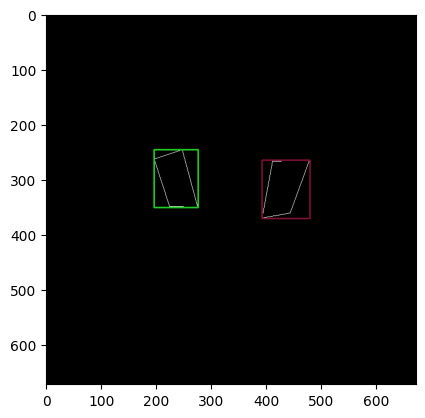

In [23]:
rng = np.random.default_rng()

for mascara in masks:
    contours, _ = cv2.findContours(mascara.imagem, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours_poly = [None] * len(contours)
    boundRect = [None] * len(contours)
    centers = [None] * len(contours)
    radius = [None] * len(contours)

    for i, c in enumerate(contours):
        contours_poly[i] = cv2.approxPolyDP(c, 3, True)
        boundRect[i] = cv2.boundingRect(contours_poly[i])

    drawing = np.zeros((mascara.imagem.shape[0], mascara.imagem.shape[1], 3), dtype=np.uint8)

    for i in range(len(contours)):
        color = tuple(rng.integers(0, 256, size=3).tolist())
        cv2.drawContours(drawing, contours_poly, i, (255, 255, 255))
        cv2.rectangle(drawing, (int(boundRect[i][0]), int(boundRect[i][1])),
                      (int(boundRect[i][0] + boundRect[i][2]), int(boundRect[i][1] + boundRect[i][3])), color, 2)

    plt.imshow(drawing)
    plt.show()


In [30]:
list_retinanet = []
for cont in range(0, len(masks)):
    contours, _ = cv2.findContours(masks[cont].imagem, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    lista_intermediaria = [cv2.boundingRect(contour) for contour in contours]
    for val in lista_intermediaria.copy():
        if (val[2] * val[3] < 170):
            lista_intermediaria.remove(val)

    for j in range(0,len(lista_intermediaria)):
        list_retinanet.append([ masks[cont].paciente, masks[cont].tipo, masks[cont].exame, masks[cont].classe, list(lista_intermediaria[j]), pastas_jpg[cont]] )

In [32]:
df_retinanet = pd.DataFrame(list_retinanet, columns=['paciente','tipo','exame','classificacao','anotacoes','image_path'])
df_retinanet.head()

,paciente,tipo,exame,classificacao,anotacoes,image_path
0,Patient_1,SPAIR,Exame 1,Negativo,"[392, 257, 82, 74]",./SPAIR_JPG/Patient_1/Exame 1/Negativo/_IM-000...
1,Patient_1,SPAIR,Exame 1,Negativo,"[171, 245, 89, 83]",./SPAIR_JPG/Patient_1/Exame 1/Negativo/_IM-000...
2,Patient_1,SPAIR,Exame 1,Negativo,"[390, 252, 109, 89]",./SPAIR_JPG/Patient_1/Exame 1/Negativo/_IM-000...
3,Patient_1,SPAIR,Exame 1,Negativo,"[170, 245, 96, 98]",./SPAIR_JPG/Patient_1/Exame 1/Negativo/_IM-000...
4,Patient_1,SPAIR,Exame 1,Negativo,"[407, 248, 86, 108]",./SPAIR_JPG/Patient_1/Exame 1/Negativo/_IM-000...


In [33]:
df_retinanet[['x','y','width','height']] = pd.DataFrame(df_retinanet.anotacoes.tolist(), index = df_retinanet.index)
df_retinanet = df_retinanet.drop(columns=['anotacoes'])
df_retinanet['class'] = 'sacroiliaca'
df_retinanet.head()

,paciente,tipo,exame,classificacao,image_path,x,y,width,height,class
0,Patient_1,SPAIR,Exame 1,Negativo,./SPAIR_JPG/Patient_1/Exame 1/Negativo/_IM-000...,392,257,82,74,sacroiliaca
1,Patient_1,SPAIR,Exame 1,Negativo,./SPAIR_JPG/Patient_1/Exame 1/Negativo/_IM-000...,171,245,89,83,sacroiliaca
2,Patient_1,SPAIR,Exame 1,Negativo,./SPAIR_JPG/Patient_1/Exame 1/Negativo/_IM-000...,390,252,109,89,sacroiliaca
3,Patient_1,SPAIR,Exame 1,Negativo,./SPAIR_JPG/Patient_1/Exame 1/Negativo/_IM-000...,170,245,96,98,sacroiliaca
4,Patient_1,SPAIR,Exame 1,Negativo,./SPAIR_JPG/Patient_1/Exame 1/Negativo/_IM-000...,407,248,86,108,sacroiliaca


In [34]:
X = df_retinanet.iloc[:,0:8]
y = df_retinanet.iloc[:,8]

In [35]:
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.8, random_state=42)

groups    = df_retinanet.paciente
idx_train = []
idx_test  = []

for i, (train_index, test_index) in enumerate( gss.split(X,y,groups=groups) ):
    idx_train.append(train_index)
    idx_test.append(test_index)

dados_train = df_retinanet.iloc[ idx_train[0] ]
dados_test  = df_retinanet.iloc[ idx_test[0] ]

In [36]:
dados_test.paciente.unique()

array(['Patient_21', 'Patient_25', 'Patient_27', 'Patient_32',
       'Patient_33', 'Patient_34', 'Patient_38', 'Patient_5', 'Patient_6',
       'Patient_8'], dtype=object)

In [37]:
dados_train.paciente.unique()

array(['Patient_1', 'Patient_10', 'Patient_11', 'Patient_12',
       'Patient_13', 'Patient_14', 'Patient_15', 'Patient_16',
       'Patient_17', 'Patient_18', 'Patient_19', 'Patient_2',
       'Patient_20', 'Patient_22', 'Patient_23', 'Patient_24',
       'Patient_26', 'Patient_28', 'Patient_29', 'Patient_3',
       'Patient_30', 'Patient_31', 'Patient_35', 'Patient_36',
       'Patient_37', 'Patient_39', 'Patient_4', 'Patient_40',
       'Patient_41', 'Patient_42', 'Patient_43', 'Patient_44',
       'Patient_45', 'Patient_46', 'Patient_47', 'Patient_48',
       'Patient_49', 'Patient_7', 'Patient_9'], dtype=object)

In [38]:
columns_to_drop = ['paciente', 'tipo', 'exame', 'classificacao', 'class']

dados_train = dados_train.drop(columns=columns_to_drop)
dados_test = dados_test.drop(columns=columns_to_drop)

In [39]:
dados_train

,image_path,x,y,width,height
0,./SPAIR_JPG/Patient_1/Exame 1/Negativo/_IM-000...,392,257,82,74
1,./SPAIR_JPG/Patient_1/Exame 1/Negativo/_IM-000...,171,245,89,83
2,./SPAIR_JPG/Patient_1/Exame 1/Negativo/_IM-000...,390,252,109,89
3,./SPAIR_JPG/Patient_1/Exame 1/Negativo/_IM-000...,170,245,96,98
4,./SPAIR_JPG/Patient_1/Exame 1/Negativo/_IM-000...,407,248,86,108
...,...,...,...,...,...
1124,./STIR_JPG/Patient_9/Exame 1/Negativo/_IM-0241...,194,256,76,97
1125,./STIR_JPG/Patient_9/Exame 1/Negativo/_IM-0241...,396,263,91,109
1126,./STIR_JPG/Patient_9/Exame 1/Negativo/_IM-0241...,191,255,84,92
1127,./STIR_JPG/Patient_9/Exame 1/Negativo/_IM-0241...,392,265,87,106


In [40]:
dados_test

,image_path,x,y,width,height
336,./SPAIR_JPG/Patient_33/Exame 1/Negativo/_IM-00...,178,262,78,73
337,./SPAIR_JPG/Patient_33/Exame 1/Negativo/_IM-00...,412,254,77,78
338,./SPAIR_JPG/Patient_33/Exame 1/Negativo/_IM-00...,192,262,81,78
339,./SPAIR_JPG/Patient_33/Exame 1/Negativo/_IM-00...,408,252,78,98
340,./SPAIR_JPG/Patient_33/Exame 1/Negativo/_IM-00...,179,253,88,108
...,...,...,...,...,...
1100,./STIR_JPG/Patient_7/Exame 1/Negativo/_IM-0270...,182,233,92,108
1101,./STIR_JPG/Patient_7/Exame 1/Negativo/_IM-0270...,400,240,93,121
1102,./STIR_JPG/Patient_7/Exame 1/Negativo/_IM-0270...,186,230,84,117
1103,./STIR_JPG/Patient_7/Exame 1/Negativo/_IM-0270...,397,232,92,129


In [42]:
PRETRAINED_MODEL = '_pretrained_model.h5'

URL_MODEL = 'https://github.com/fizyr/keras-retinanet/releases/download/0.5.1/resnet50_coco_best_v2.1.0.h5'
urllib.request.urlretrieve(URL_MODEL, PRETRAINED_MODEL)
print('Caminho do modelo pré-treinado: ' + PRETRAINED_MODEL)

Caminho do modelo pré-treinado: _pretrained_model.h5


In [43]:
def create_tf_example(rowss,data_df):
    """
    Create a tf.Example entry for a given training image.
    """
    full_path = os.path.join(rowss.image_path)
    with tf.io.gfile.GFile(full_path, 'rb') as fid:
        encoded_jpg = fid.read()
    encoded_jpg_io = io.BytesIO(encoded_jpg)
    image = Image.open(rowss.image_path)
    if image.format != 'JPEG':
        print(image.format)
        raise ValueError('Image format not JPEG')

    xmins = []
    xmaxs = []
    ymins = []
    ymaxs = []

    xmin = rowss['x']
    xmax = rowss['x']+rowss['width']
    ymin = rowss['y']
    ymax = rowss['y']+rowss['height']

    return rowss['image_path'],xmin,ymin,xmax,ymax

In [44]:
for index, row in dados_train.iterrows():
    image_path,xmins,ymins,xmaxs,ymaxs=create_tf_example(row,dados_train)
    dados_train.loc[index,'image_path']=image_path
    dados_train.loc[index,'x']=xmins
    dados_train.loc[index,'y']=ymins
    dados_train.loc[index,'width']=xmaxs
    dados_train.loc[index,'height']=ymaxs

In [45]:
for index, row in dados_test.iterrows():
    image_path,xmins,ymins,xmaxs,ymaxs=create_tf_example(row,dados_test)
    dados_test.loc[index,'image_path']=image_path
    dados_test.loc[index,'x']=xmins
    dados_test.loc[index,'y']=ymins
    dados_test.loc[index,'width']=xmaxs
    dados_test.loc[index,'height']=ymaxs

In [46]:
classes = pd.DataFrame([{'class':'Sacroiliaca','label':0}])
classes.to_csv("classes.csv",index=False,header=False)

dados_train['class']='Sacroiliaca'
dados_train.x = dados_train.x.astype(int)
dados_train.y = dados_train.y.astype(int)
dados_train.width = dados_train.width.astype(int)
dados_train.height = dados_train.height.astype(int)

dados_train[['image_path','x','y','width','height','class']].to_csv("annotation.csv",index=False,header=False)

In [49]:
!python ./keras_retinanet/bin/train.py --freeze-backbone --random-transform --weights {PRETRAINED_MODEL} --batch-size 1 --steps 500 --epochs 2 csv annotation.csv classes.csv

2023-07-10 19:42:01.164845: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Creating model, this may take a second...
/usr/local/lib/python3.10/dist-packages/keras/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(
Model: "retinanet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                             

In [50]:
model_path = os.path.join('snapshots', sorted(os.listdir('snapshots'), reverse=True)[0])

model = models.load_model(model_path, backbone_name='resnet50')
model = models.convert_model(model)

rotulos = pd.read_csv('classes.csv', header=None).T.loc[0].to_dict()

THRES_SCORE = 0.4

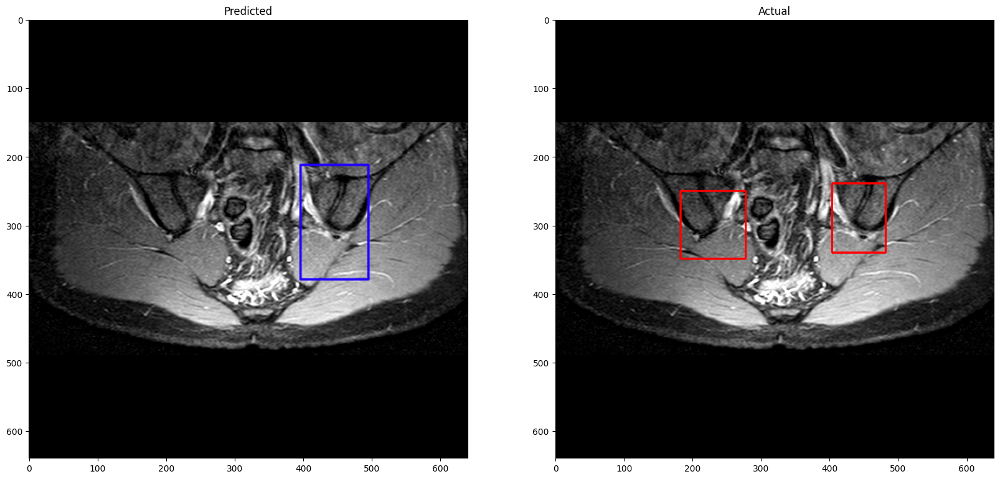

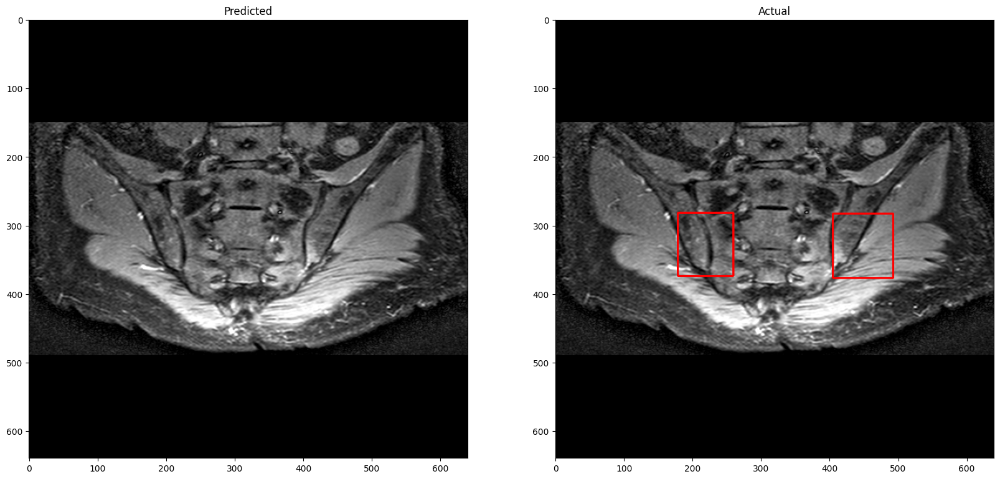

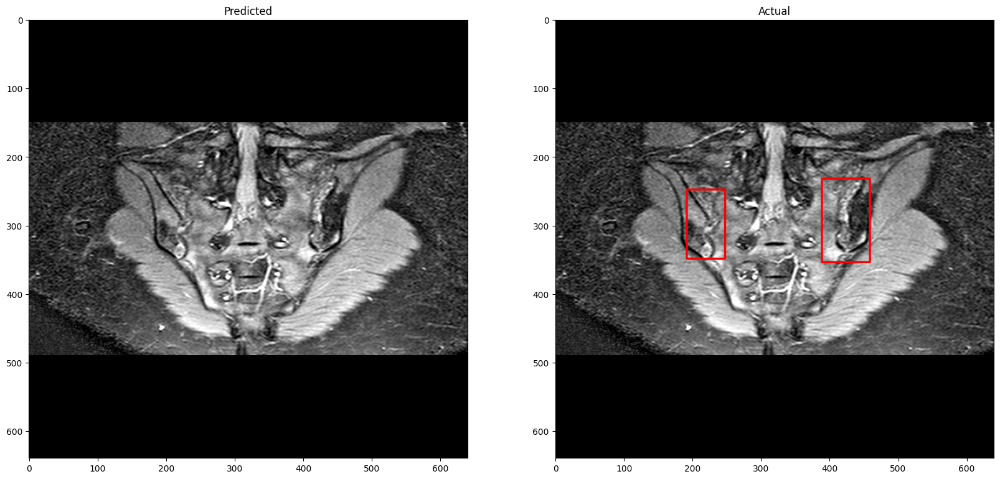

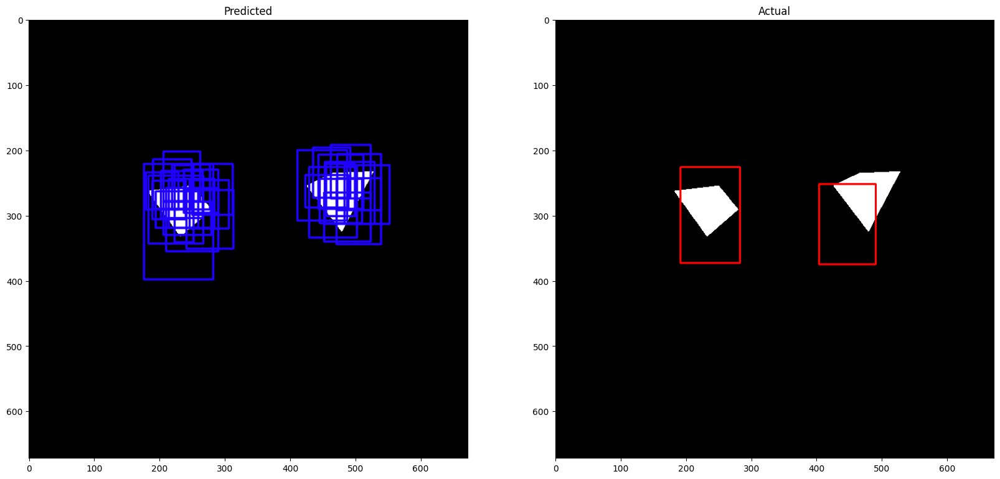

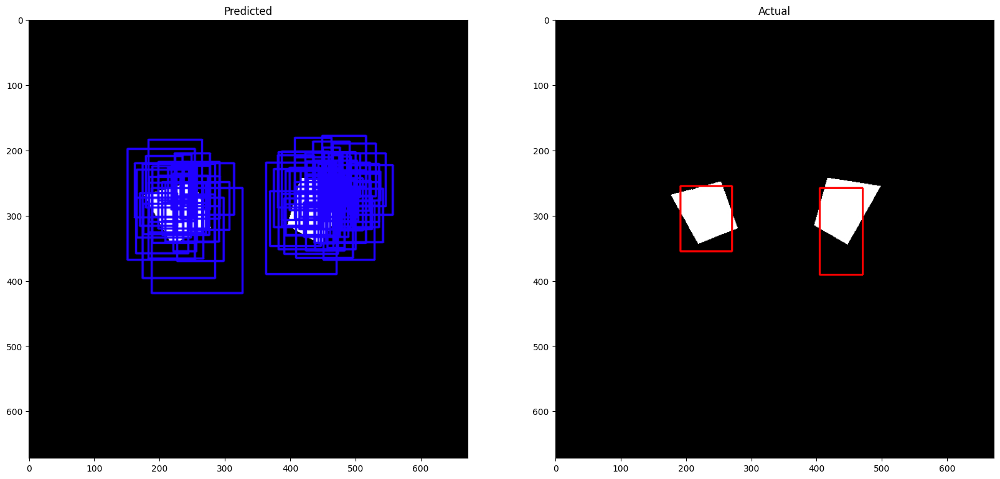

...

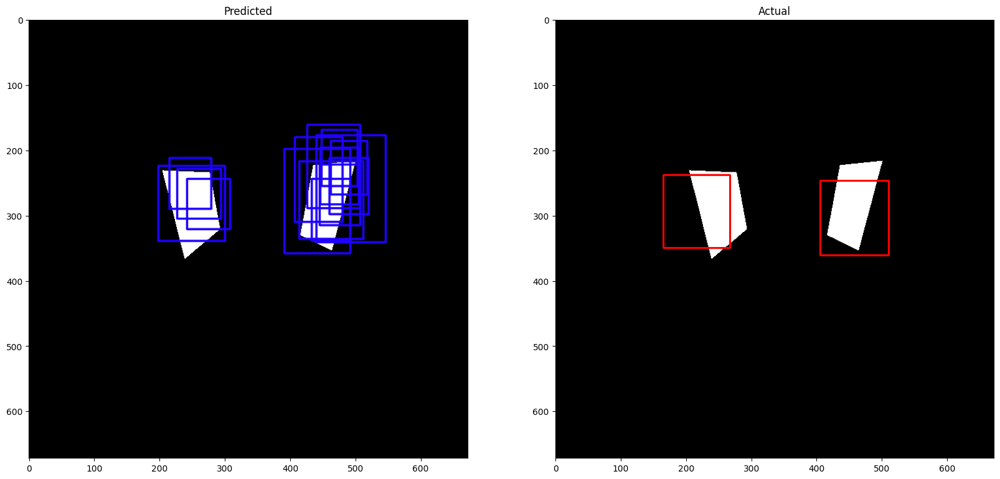

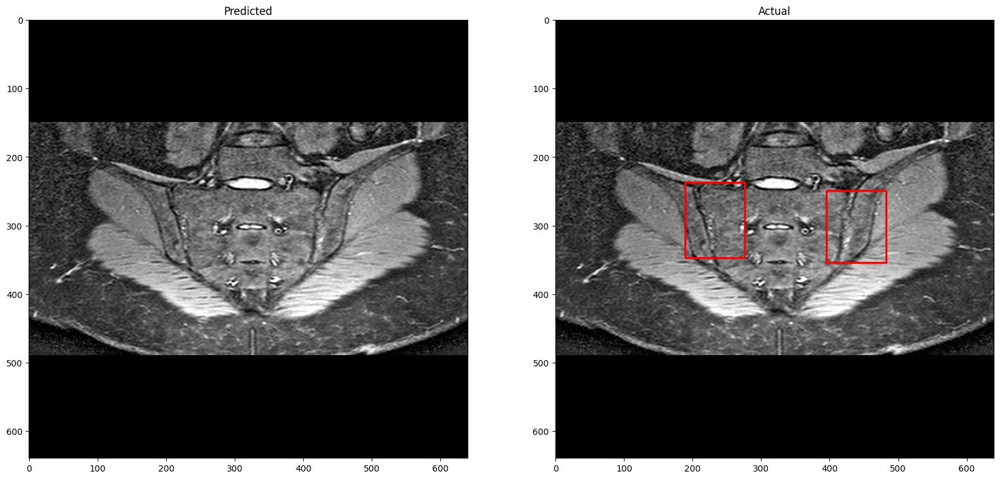

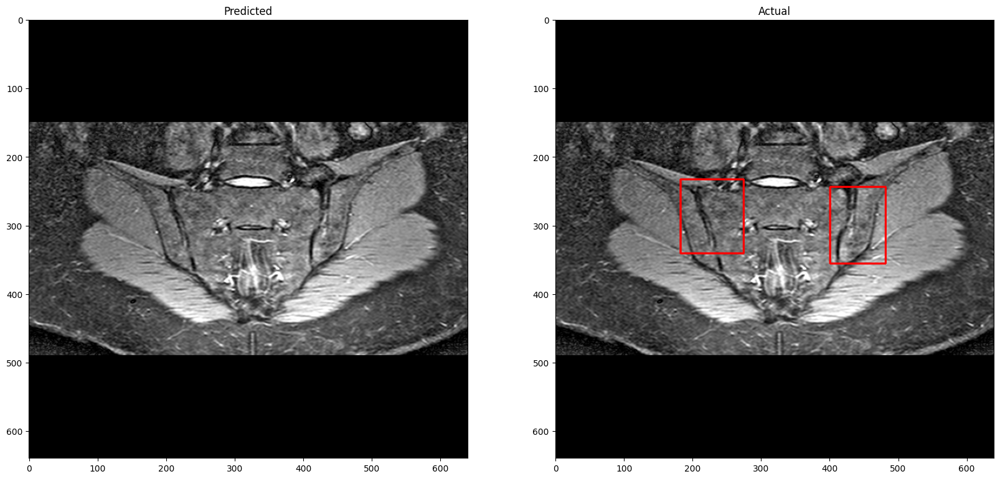

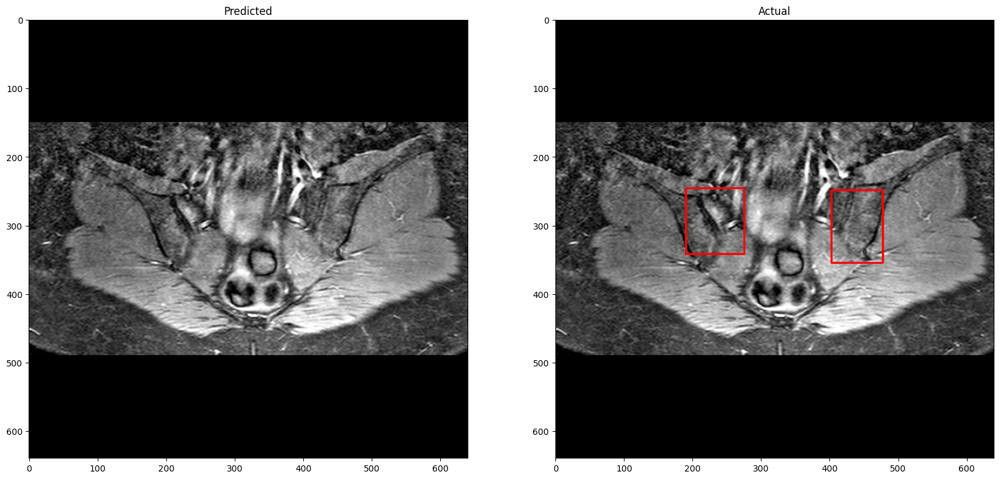

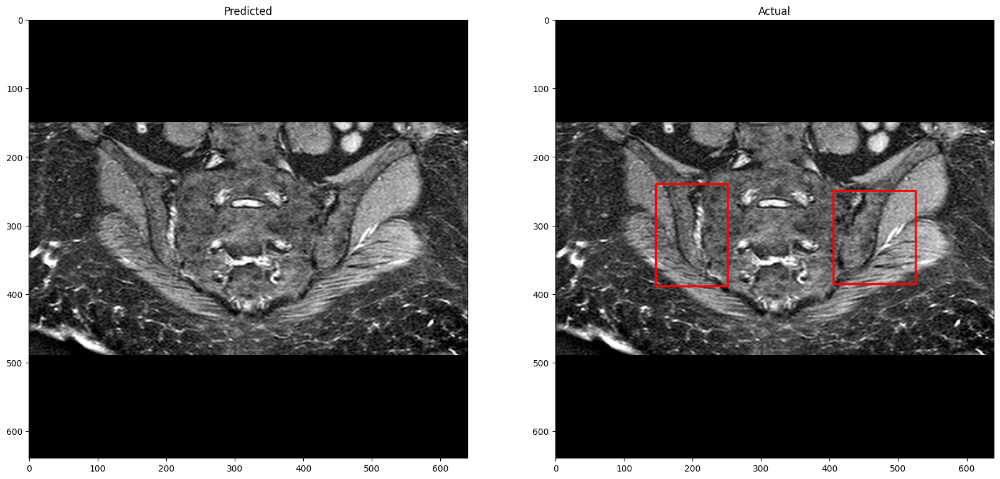

In [53]:
data = dados_test.sample(n=15)
for i,r in data.iterrows():
    img_inference(r['image_path'])